In [ ]:
'''
降维指标（局部/全局拓扑保持）热图
'''

In [ ]:
'''
metrics = ['knn_10','knn_20','knn_30','svm','nkr_10','nkr_20','nkr_30','aji_10','aji_20','aji_30','random_triplet','spearman','k-nearest','centroid_distance']

metrics = ['AUC','Qlocal','Qglobal','T_10','T_20','T_30','C_10','C_20','C_30']

metrics = ['Mrre_false_10','Mrre_false_20','Mrre_false_30','Mrre_missing_10','Mrre_missing_20','Mrre_missing_30','Pearson','nh_10','nh_20','nh_30']
'''

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import make_interp_spline
import os

In [2]:
colors = ["#313695", "#4575b4", "#74add1", "#abd9e9",
          "#e0f3f8", "#ffffbf",
          "#fee090", "#fdae61", "#f46d43", "#d73027", "#a50026"]
cmap = LinearSegmentedColormap.from_list("blue_yellow_red", colors)

### scDesign3

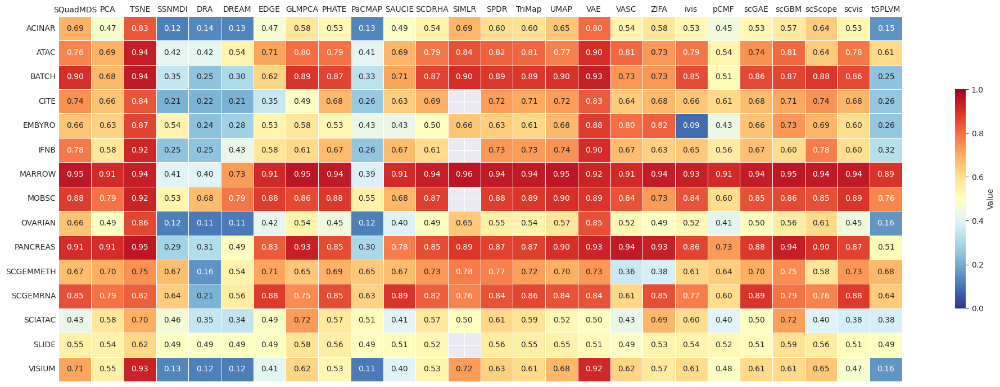

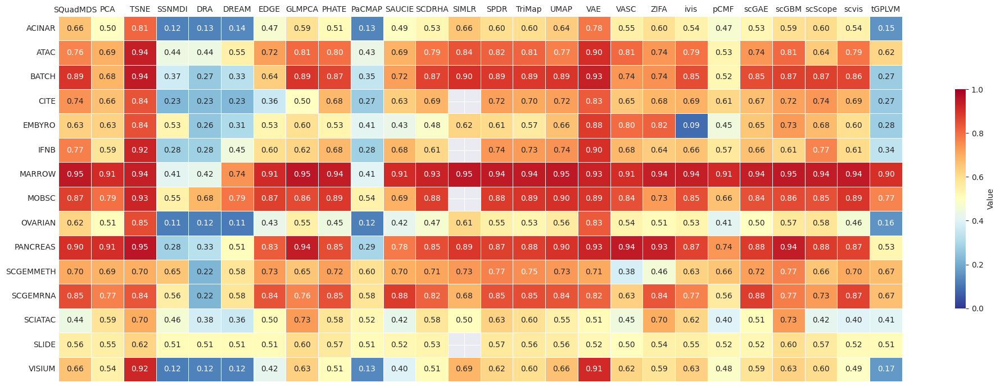

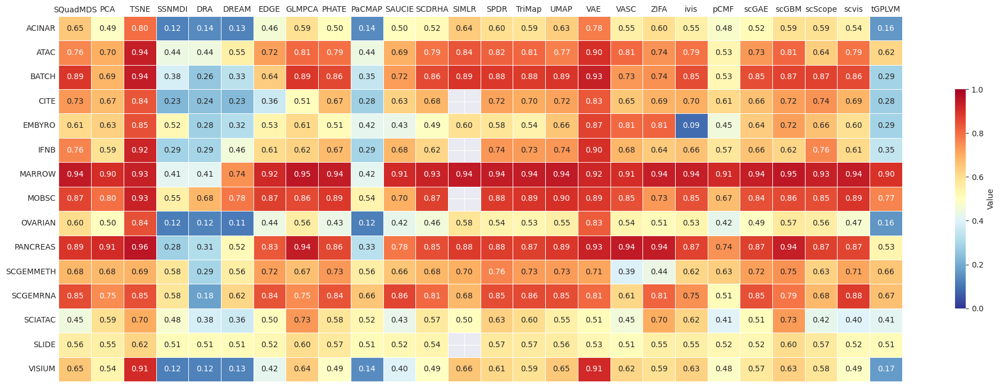

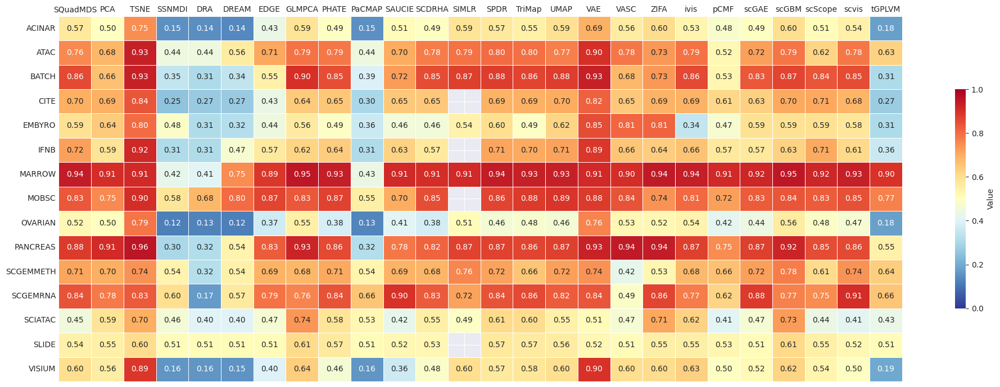

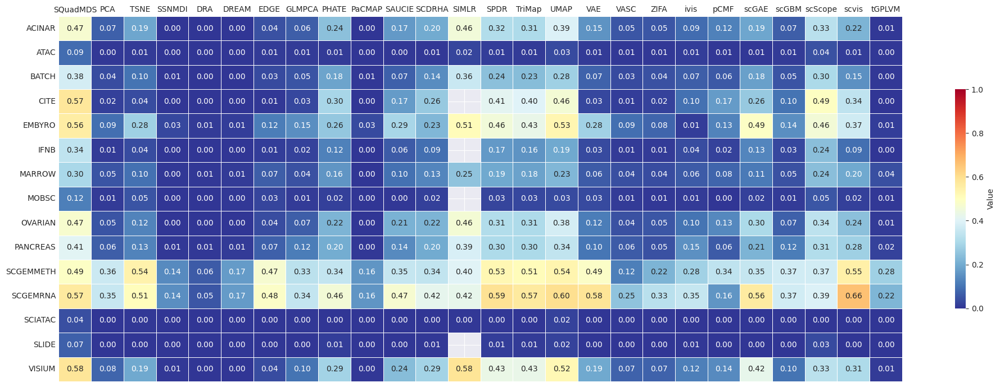

...

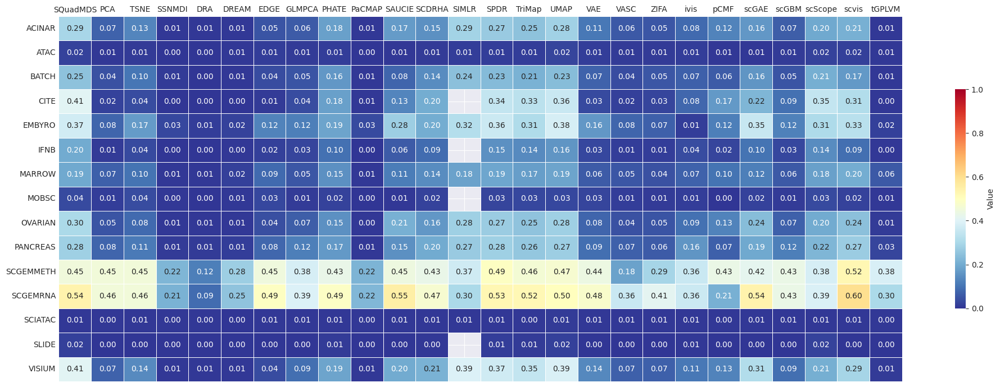

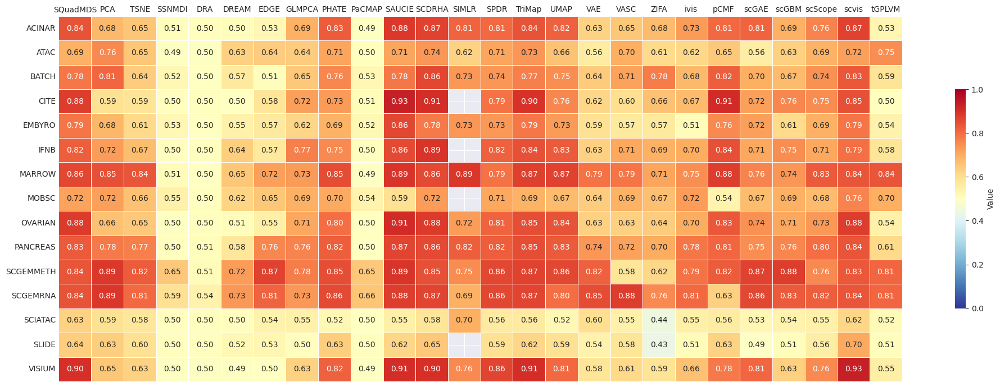

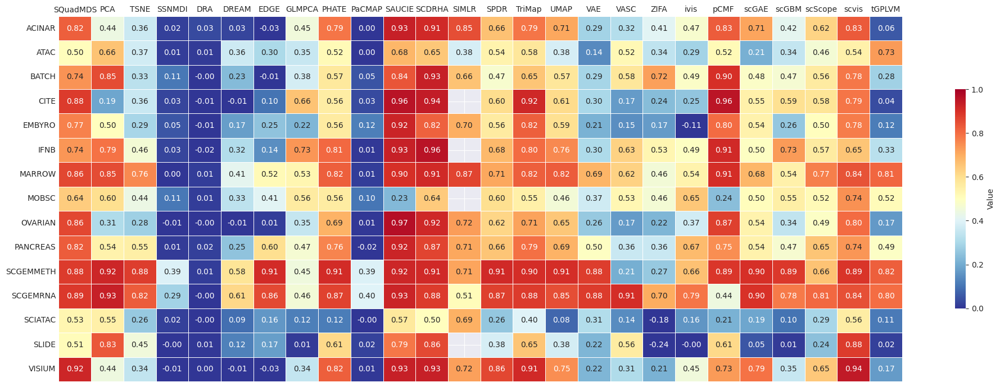

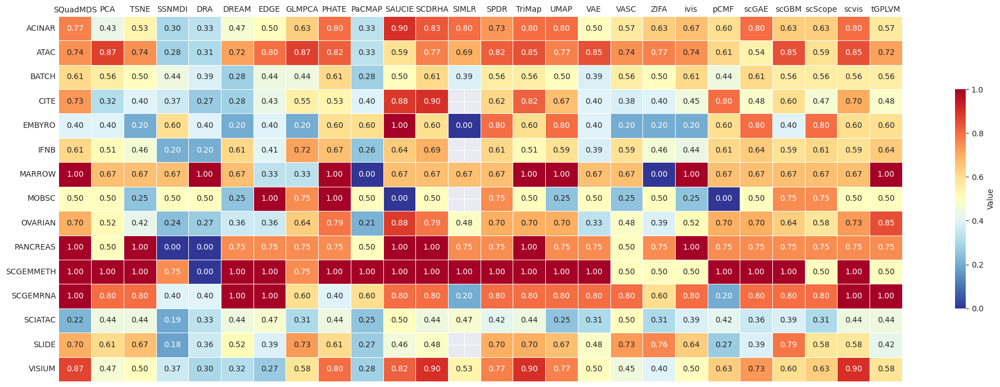

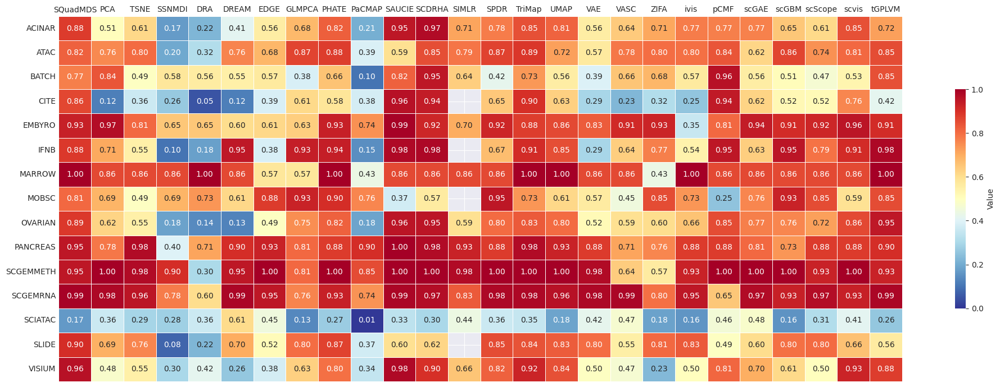

In [3]:
metrics = ['knn_10','knn_20','knn_30','svm','nkr_10','nkr_20','nkr_30','aji_10','aji_20','aji_30','random_triplet','spearman','k-nearest','centroid_distance']

for metric in metrics:
    datasets = ['ATAC','BATCH','CITE','EMBYRO','IFNB','MARROW','MOBSC','OVARIAN','PANCREAS','SCGEMMETH','SCGEMRNA','SCIATAC','SLIDE','ACINAR','VISIUM']
    df_all = pd.DataFrame()

    for dataset in datasets:
        file = f"/home/henu/work/result/metric/scDesign3/{dataset}/dr1.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 7))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/scDesign3.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/scDesign3.pdf')
    # plt.show()


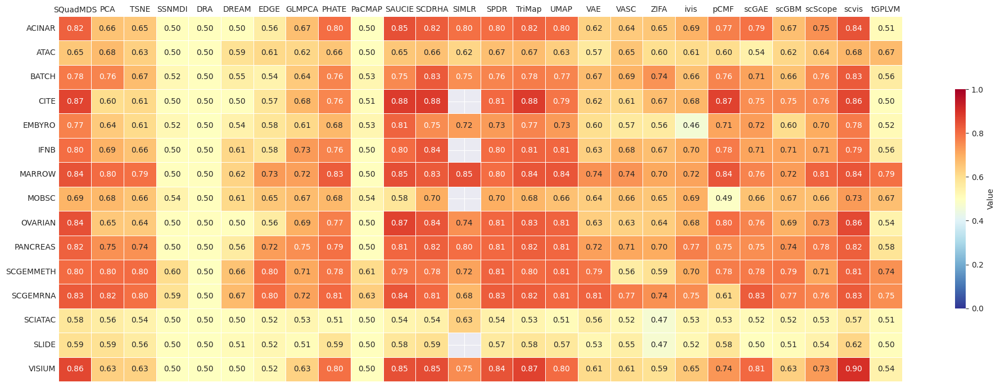

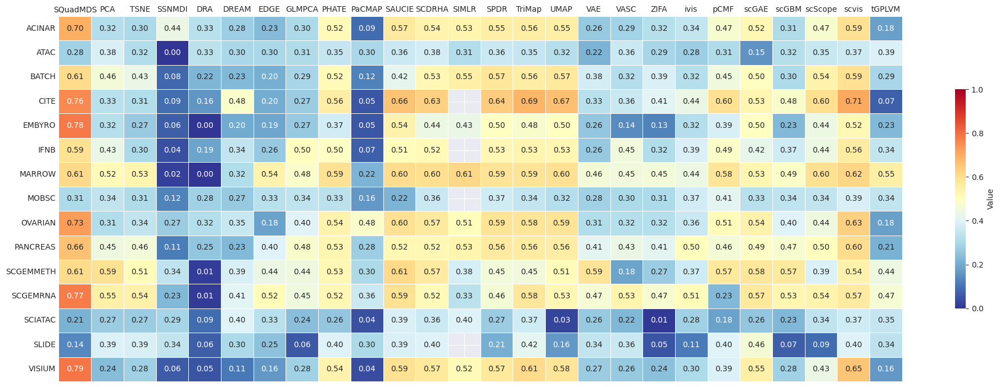

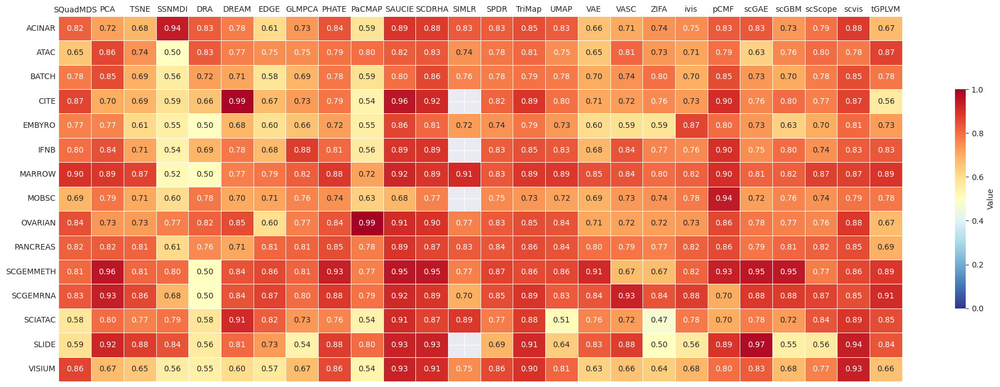

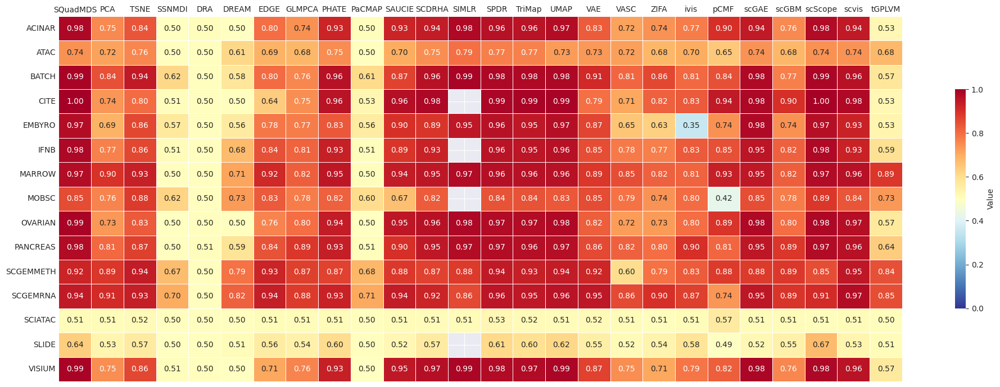

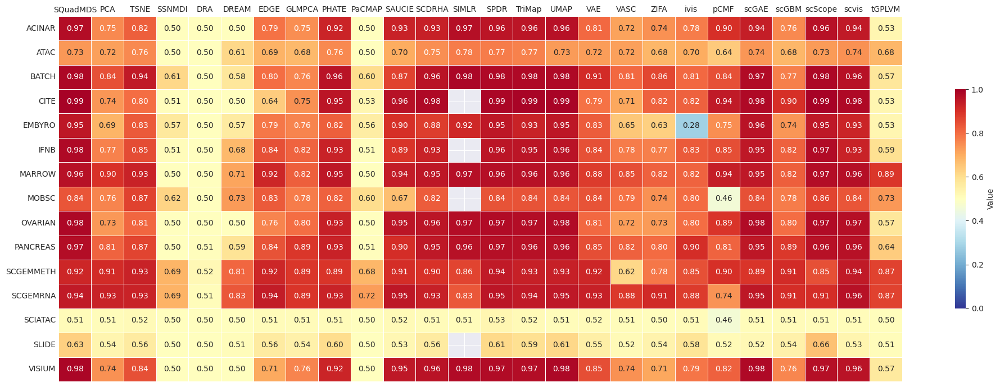

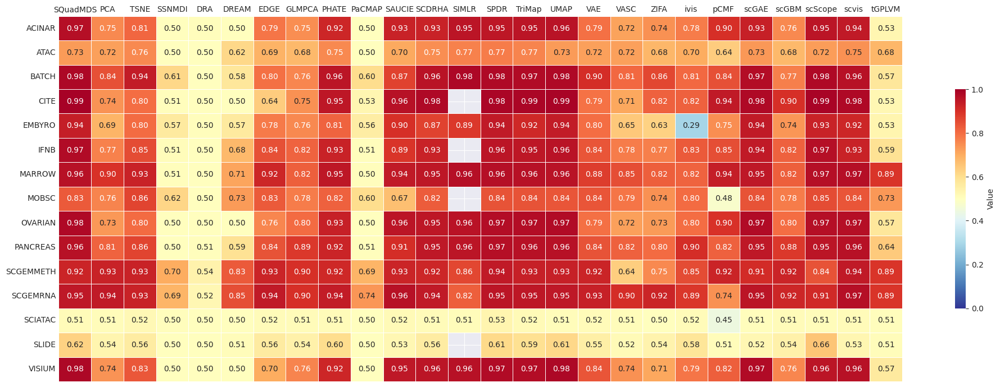

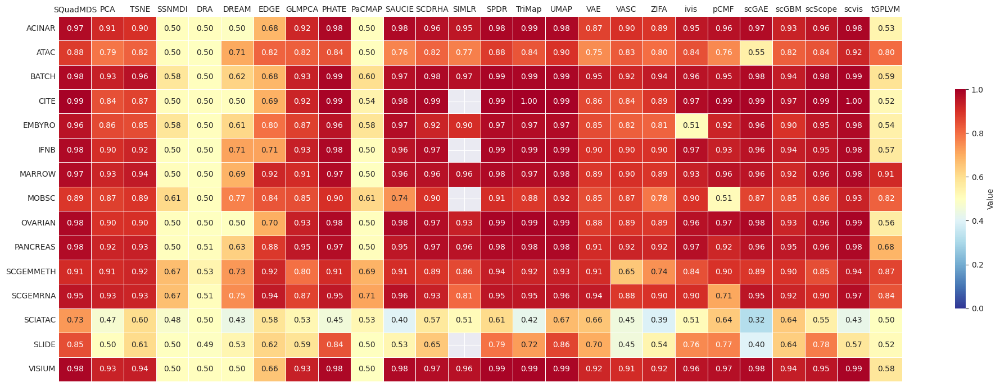

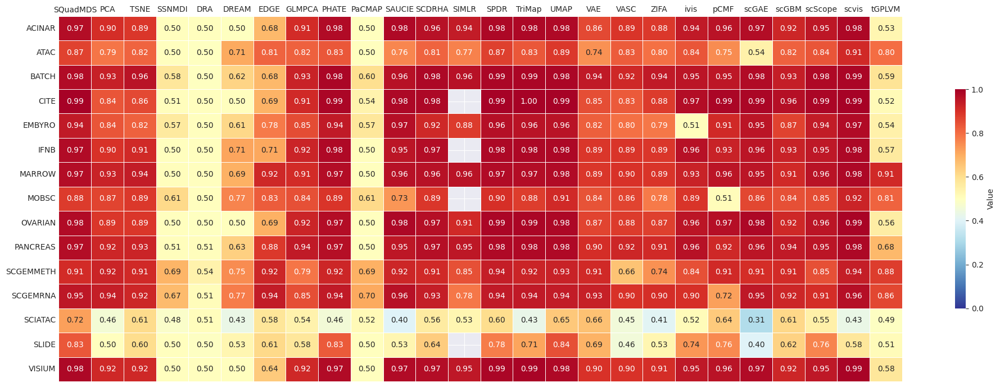

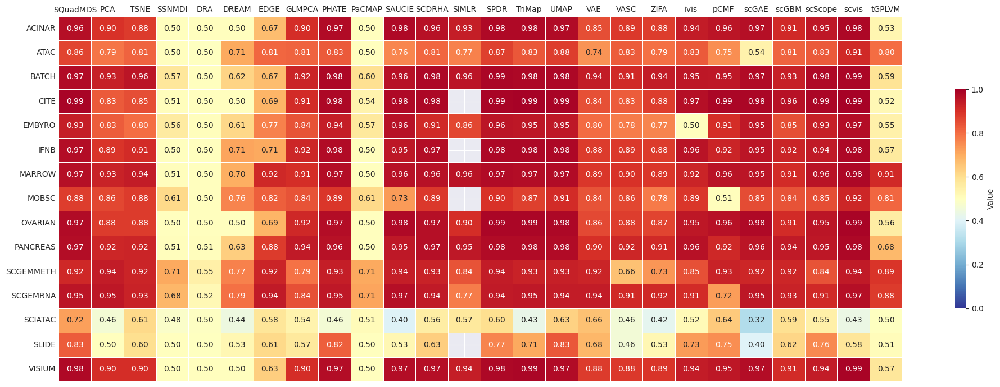

In [4]:
metrics = ['AUC','Qlocal','Qglobal','T_10','T_20','T_30','C_10','C_20','C_30']

for metric in metrics:
    datasets = ['ATAC','BATCH','CITE','EMBYRO','IFNB','MARROW','MOBSC','OVARIAN','PANCREAS','SCGEMMETH','SCGEMRNA','SCIATAC','SLIDE','ACINAR','VISIUM']
    df_all = pd.DataFrame()

    for dataset in datasets:
        file = f"/home/henu/work/result/metric/scDesign3/{dataset}/dr2.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 7))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/scDesign3.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/scDesign3.pdf')
    # plt.show()


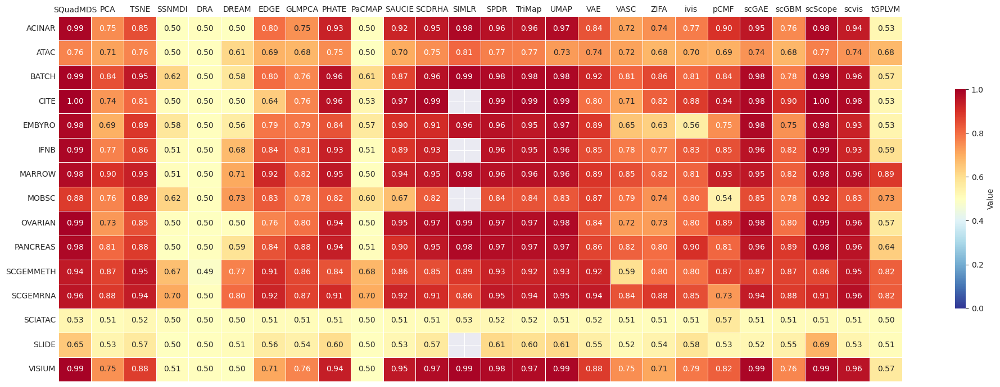

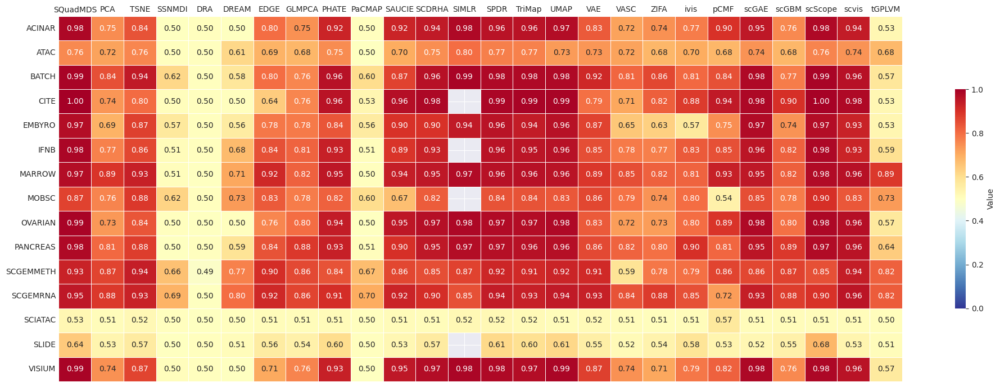

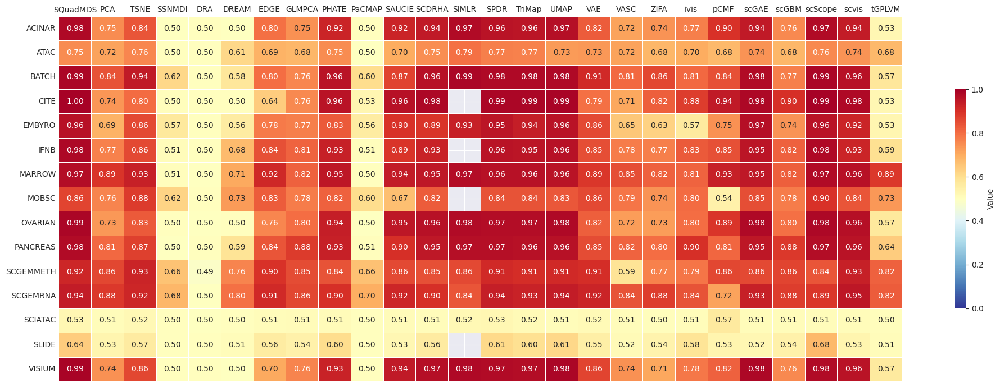

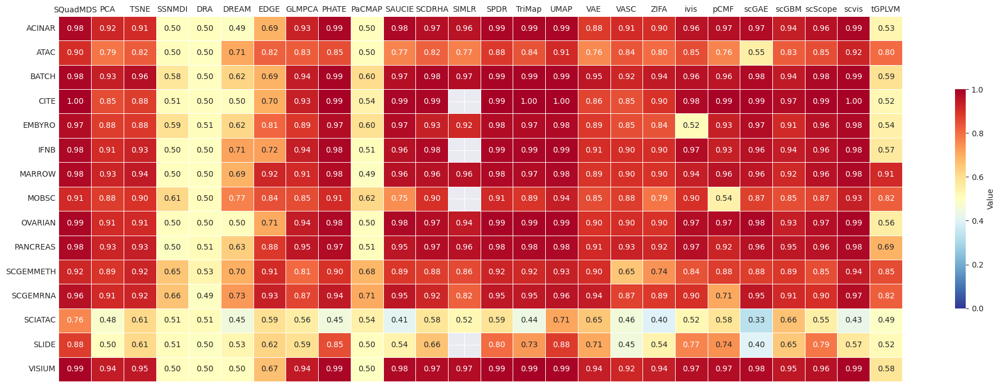

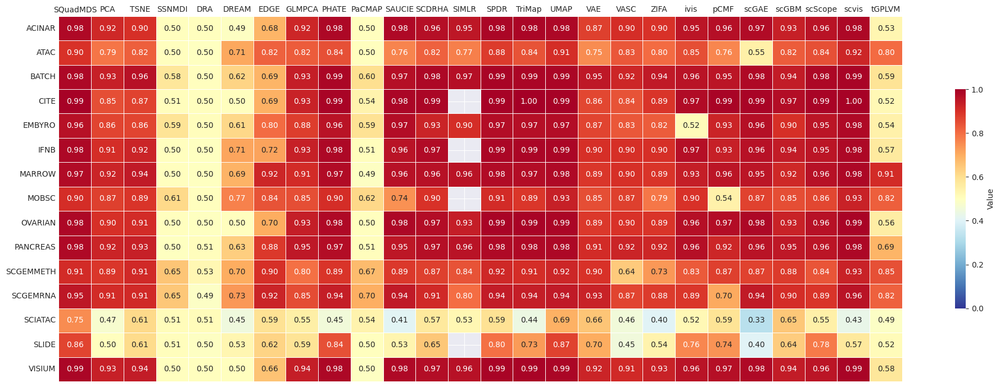

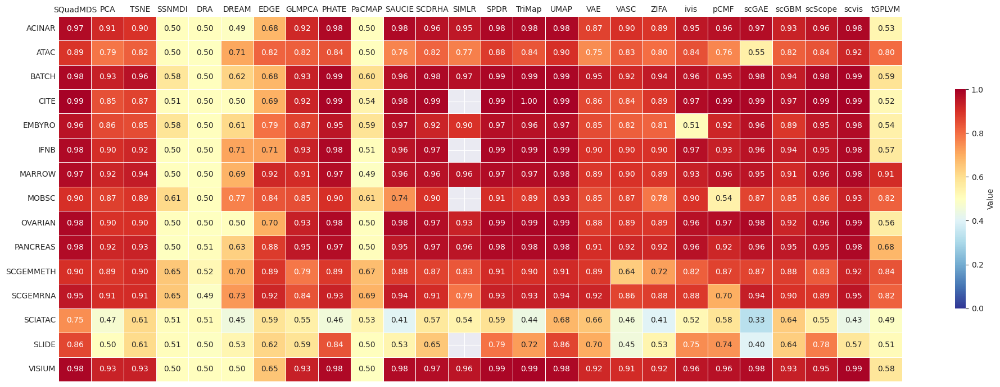

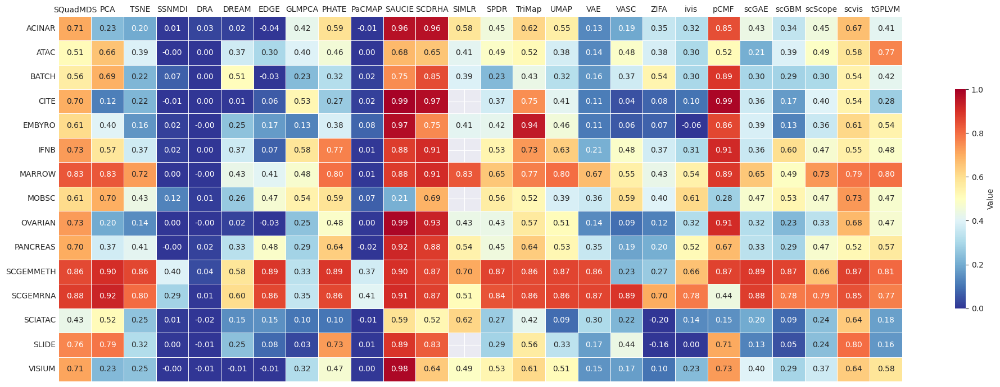

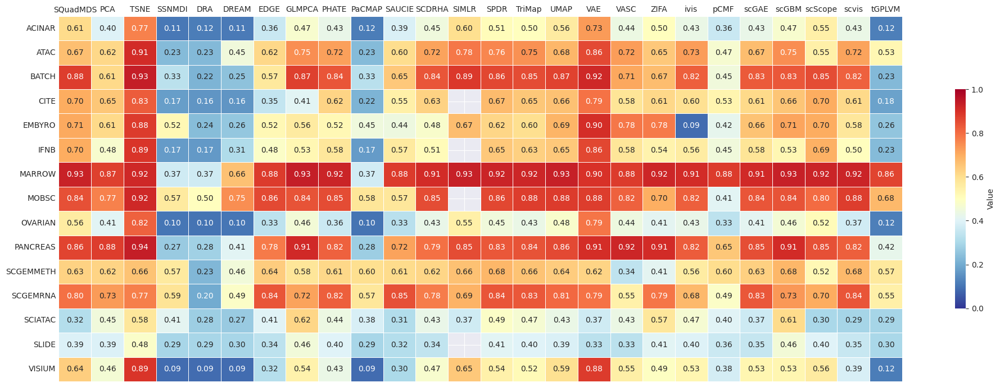

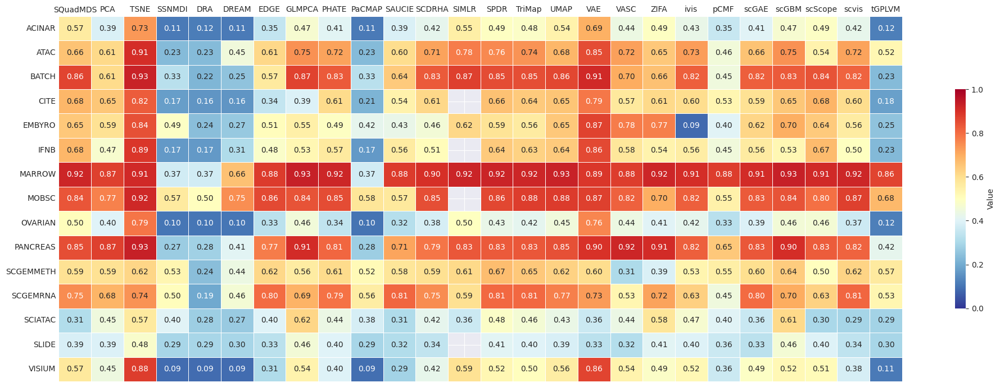

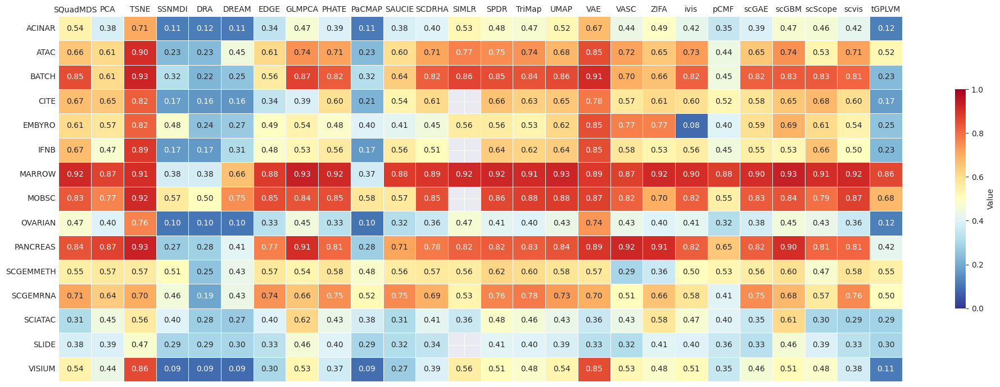

In [5]:
metrics = ['Mrre_false_10','Mrre_false_20','Mrre_false_30','Mrre_missing_10','Mrre_missing_20','Mrre_missing_30','Pearson','nh_10','nh_20','nh_30']

for metric in metrics:
    datasets = ['ATAC','BATCH','CITE','EMBYRO','IFNB','MARROW','MOBSC','OVARIAN','PANCREAS','SCGEMMETH','SCGEMRNA','SCIATAC','SLIDE','ACINAR','VISIUM']
    df_all = pd.DataFrame()

    for dataset in datasets:
        file = f"/home/henu/work/result/metric/scDesign3/{dataset}/dr3.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 7))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/scDesign3.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/scDesign3.pdf')
    # plt.show()


### SIMLR

In [ ]:
metrics = ['knn_10','knn_20','knn_30','svm','nkr_10','nkr_20','nkr_30','aji_10','aji_20','aji_30','random_triplet','spearman','k-nearest','centroid_distance']
for metric in metrics:
    file1 = f"/home/henu/work/result/metric/SIMLR/Pollen/dr1.csv"
    file2 = f"/home/henu/work/result/metric/SIMLR/Usoskin/dr1.csv"

    # 读取文件
    df1 = pd.read_csv(file1)
    df1['Dataset'] = 'Pollen'
    df2 = pd.read_csv(file2)
    df2['Dataset'] = 'Usoskin'

    # 排除特定的行
    excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
    df1 = df1[~df1['Method'].isin(excluded_methods)]
    df2 = df2[~df2['Method'].isin(excluded_methods)]

    # 重命名方法名
    df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

    # 拼接
    df_all = pd.concat([df1, df2])

    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))

    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 1.05))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/SIMLR.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/SIMLR.pdf')
    # plt.show()

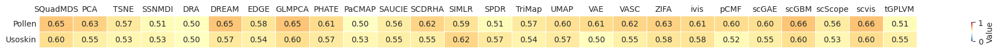

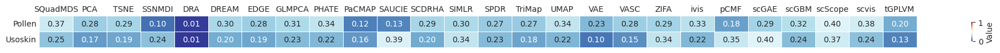

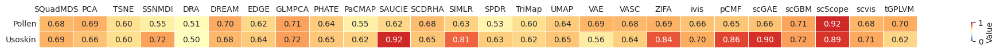

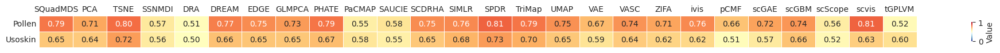

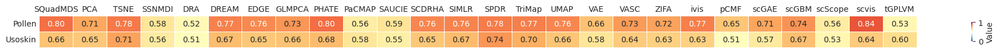

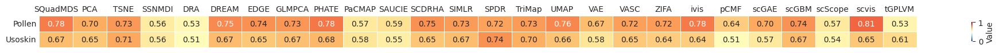

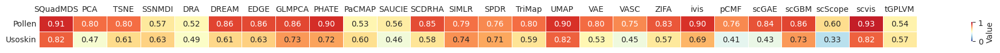

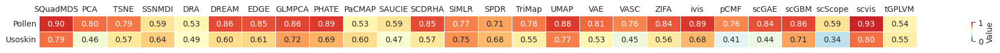

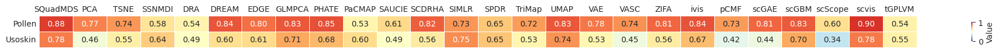

In [6]:
metrics = ['AUC','Qlocal','Qglobal','T_10','T_20','T_30','C_10','C_20','C_30']
for metric in metrics:
    file1 = f"/home/henu/work/result/metric/SIMLR/Pollen/dr2.csv"
    file2 = f"/home/henu/work/result/metric/SIMLR/Usoskin/dr2.csv"

    # 读取文件
    df1 = pd.read_csv(file1)
    df1['Dataset'] = 'Pollen'
    df2 = pd.read_csv(file2)
    df2['Dataset'] = 'Usoskin'

    # 排除特定的行
    excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
    df1 = df1[~df1['Method'].isin(excluded_methods)]
    df2 = df2[~df2['Method'].isin(excluded_methods)]

    # 重命名方法名
    df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

    # 拼接
    df_all = pd.concat([df1, df2])

    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))

    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 1.05))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/SIMLR.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/SIMLR.pdf')
    # plt.show()

In [ ]:
metrics = ['Mrre_false_10','Mrre_false_20','Mrre_false_30','Mrre_missing_10','Mrre_missing_20','Mrre_missing_30','Pearson','nh_10','nh_20','nh_30']
for metric in metrics:
    file1 = f"/home/henu/work/result/metric/SIMLR/Pollen/dr3.csv"
    file2 = f"/home/henu/work/result/metric/SIMLR/Usoskin/dr3.csv"

    # 读取文件
    df1 = pd.read_csv(file1)
    df1['Dataset'] = 'Pollen'
    df2 = pd.read_csv(file2)
    df2['Dataset'] = 'Usoskin'

    # 排除特定的行
    excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
    df1 = df1[~df1['Method'].isin(excluded_methods)]
    df2 = df2[~df2['Method'].isin(excluded_methods)]

    # 重命名方法名
    df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

    # 拼接
    df_all = pd.concat([df1, df2])

    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))

    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 1.05))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/SIMLR.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/SIMLR.pdf')
    # plt.show()

### benchmarker

In [ ]:
metrics = ['knn_10','knn_20','knn_30','svm','nkr_10','nkr_20','nkr_30','aji_10','aji_20','aji_30','random_triplet','spearman','k-nearest','centroid_distance']
for metric in metrics:
    '''
    file和df这两处需要修改
    '''
    file1 = f"/home/henu/work/result/metric/benchmarker/Baron_mouse/dr1.csv"
    file2 = f"/home/henu/work/result/metric/benchmarker/Darmanis/dr1.csv"
    file3 = f"/home/henu/work/result/metric/benchmarker/Pancreatic/dr1.csv"
    file4 = f"/home/henu/work/result/metric/benchmarker/Silver/dr1.csv"
    file5 = f"/home/henu/work/result/metric/benchmarker/Zhengmix4eq/dr1.csv"

    # 读取文件
    df1 = pd.read_csv(file1)
    df1['Dataset'] = 'Baron_mouse'
    df2 = pd.read_csv(file2)
    df2['Dataset'] = 'Darmanis'
    df3 = pd.read_csv(file3)
    df3['Dataset'] = 'Pancreatic'
    df4 = pd.read_csv(file4)
    df4['Dataset'] = 'Silver'
    df5 = pd.read_csv(file5)
    df5['Dataset'] = 'Zhengmix4eq'


    # 排除特定的行
    excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
    df1 = df1[~df1['Method'].isin(excluded_methods)]
    df2 = df2[~df2['Method'].isin(excluded_methods)]
    df3 = df3[~df3['Method'].isin(excluded_methods)]
    df4 = df4[~df4['Method'].isin(excluded_methods)]
    df5 = df5[~df5['Method'].isin(excluded_methods)]

    # 重命名方法名
    df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df3.loc[df3['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df4.loc[df4['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df5.loc[df5['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

    # 拼接
    df_all = pd.concat([df1,df2,df3,df4,df5])

    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 2.1))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/benchmarker.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/benchmarker.pdf')
    # plt.show()

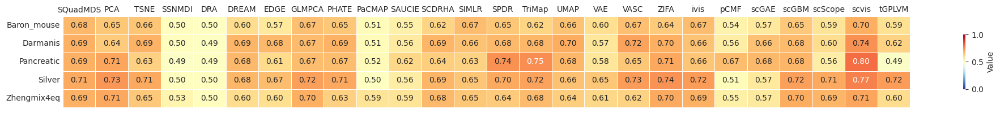

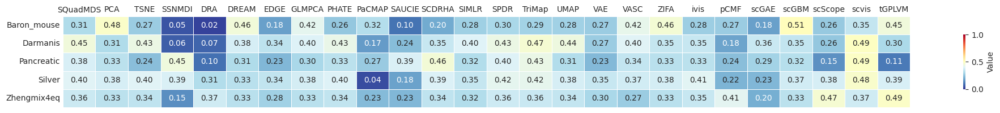

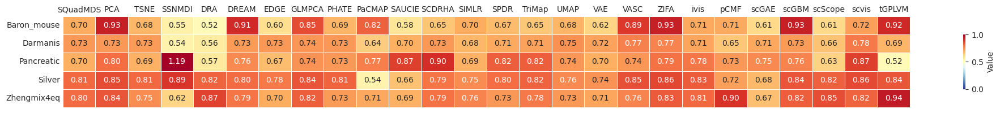

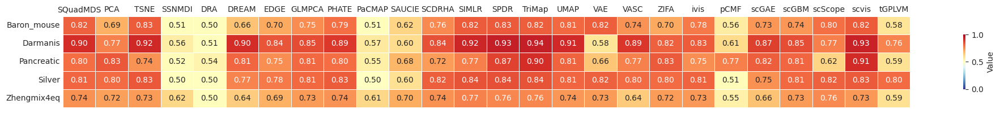

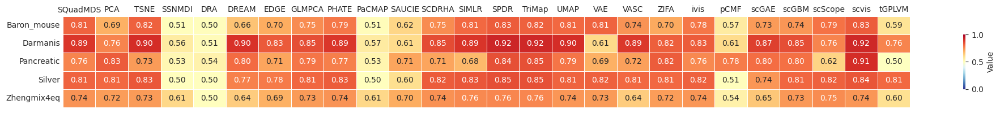

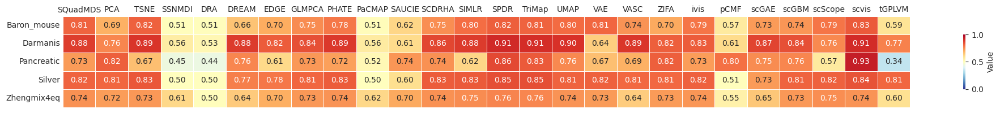

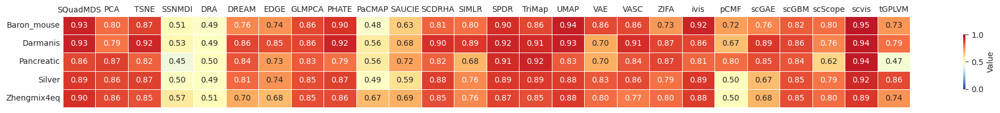

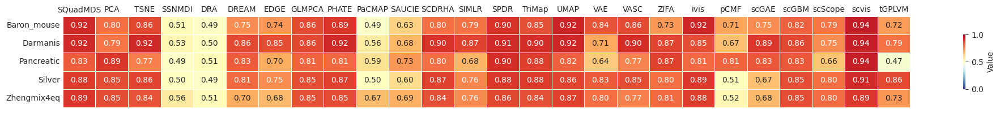

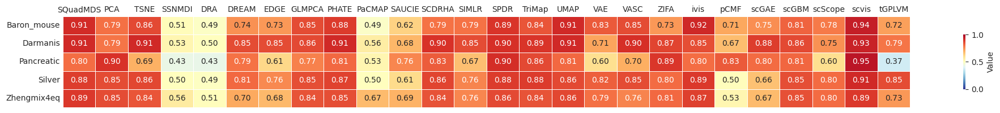

In [9]:
metrics = ['AUC','Qlocal','Qglobal','T_10','T_20','T_30','C_10','C_20','C_30']
for metric in metrics:
    '''
    file和df这两处需要修改
    '''
    file1 = f"/home/henu/work/result/metric/benchmarker/Baron_mouse/dr2.csv"
    file2 = f"/home/henu/work/result/metric/benchmarker/Darmanis/dr2.csv"
    file3 = f"/home/henu/work/result/metric/benchmarker/Pancreatic/dr2.csv"
    file4 = f"/home/henu/work/result/metric/benchmarker/Silver/dr2.csv"
    file5 = f"/home/henu/work/result/metric/benchmarker/Zhengmix4eq/dr2.csv"

    # 读取文件
    df1 = pd.read_csv(file1)
    df1['Dataset'] = 'Baron_mouse'
    df2 = pd.read_csv(file2)
    df2['Dataset'] = 'Darmanis'
    df3 = pd.read_csv(file3)
    df3['Dataset'] = 'Pancreatic'
    df4 = pd.read_csv(file4)
    df4['Dataset'] = 'Silver'
    df5 = pd.read_csv(file5)
    df5['Dataset'] = 'Zhengmix4eq'


    # 排除特定的行
    excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
    df1 = df1[~df1['Method'].isin(excluded_methods)]
    df2 = df2[~df2['Method'].isin(excluded_methods)]
    df3 = df3[~df3['Method'].isin(excluded_methods)]
    df4 = df4[~df4['Method'].isin(excluded_methods)]
    df5 = df5[~df5['Method'].isin(excluded_methods)]

    # 重命名方法名
    df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df3.loc[df3['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df4.loc[df4['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df5.loc[df5['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

    # 拼接
    df_all = pd.concat([df1,df2,df3,df4,df5])

    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 2.1))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/benchmarker.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/benchmarker.pdf')
    # plt.show()

In [ ]:
metrics = ['Mrre_false_10','Mrre_false_20','Mrre_false_30','Mrre_missing_10','Mrre_missing_20','Mrre_missing_30','Pearson','nh_10','nh_20','nh_30']
for metric in metrics:
    '''
    file和df这两处需要修改
    '''
    file1 = f"/home/henu/work/result/metric/benchmarker/Baron_mouse/dr3.csv"
    file2 = f"/home/henu/work/result/metric/benchmarker/Darmanis/dr3.csv"
    file3 = f"/home/henu/work/result/metric/benchmarker/Pancreatic/dr3.csv"
    file4 = f"/home/henu/work/result/metric/benchmarker/Silver/dr3.csv"
    file5 = f"/home/henu/work/result/metric/benchmarker/Zhengmix4eq/dr3.csv"

    # 读取文件
    df1 = pd.read_csv(file1)
    df1['Dataset'] = 'Baron_mouse'
    df2 = pd.read_csv(file2)
    df2['Dataset'] = 'Darmanis'
    df3 = pd.read_csv(file3)
    df3['Dataset'] = 'Pancreatic'
    df4 = pd.read_csv(file4)
    df4['Dataset'] = 'Silver'
    df5 = pd.read_csv(file5)
    df5['Dataset'] = 'Zhengmix4eq'


    # 排除特定的行
    excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
    df1 = df1[~df1['Method'].isin(excluded_methods)]
    df2 = df2[~df2['Method'].isin(excluded_methods)]
    df3 = df3[~df3['Method'].isin(excluded_methods)]
    df4 = df4[~df4['Method'].isin(excluded_methods)]
    df5 = df5[~df5['Method'].isin(excluded_methods)]

    # 重命名方法名
    df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df3.loc[df3['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df4.loc[df4['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df5.loc[df5['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

    # 拼接
    df_all = pd.concat([df1,df2,df3,df4,df5])

    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 2.1))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/benchmarker.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/benchmarker.pdf')
    # plt.show()

### VASC

In [ ]:
metrics = ['knn_10','knn_20','knn_30','svm','nkr_10','nkr_20','nkr_30','aji_10','aji_20','aji_30','random_triplet','spearman','k-nearest','centroid_distance']
for metric in metrics:
    file1 = f"/home/henu/work/result/metric/VASC/Baron/dr1.csv"
    file2 = f"/home/henu/work/result/metric/VASC/Biase/dr1.csv"
    file3 = f"/home/henu/work/result/metric/VASC/Goolam/dr1.csv"
    file4 = f"/home/henu/work/result/metric/VASC/Xin/dr1.csv"
    file5 = f"/home/henu/work/result/metric/VASC/yan/dr1.csv"
    file6 = f"/home/henu/work/result/metric/VASC/Zeisel/dr1.csv"

    # 读取文件
    df1 = pd.read_csv(file1)
    df1['Dataset'] = 'Baron'
    df2 = pd.read_csv(file2)
    df2['Dataset'] = 'Biase'
    df3 = pd.read_csv(file3)
    df3['Dataset'] = 'Goolam'
    df4 = pd.read_csv(file4)
    df4['Dataset'] = 'Xin'
    df5 = pd.read_csv(file5)
    df5['Dataset'] = 'yan'
    df6 = pd.read_csv(file6)
    df6['Dataset'] = 'Zeisel'


    # 排除特定的行
    excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
    df1 = df1[~df1['Method'].isin(excluded_methods)]
    df2 = df2[~df2['Method'].isin(excluded_methods)]
    df3 = df3[~df3['Method'].isin(excluded_methods)]
    df4 = df4[~df4['Method'].isin(excluded_methods)]
    df5 = df5[~df5['Method'].isin(excluded_methods)]
    df6 = df6[~df6['Method'].isin(excluded_methods)]

    # 重命名方法名
    df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df3.loc[df3['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df4.loc[df4['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df5.loc[df5['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df6.loc[df6['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

    # 拼接
    df_all = pd.concat([df1,df2,df3,df4,df5,df6])
    # print(df_all)

    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 2.45))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/VASC.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/VASC.pdf')
    # plt.show()

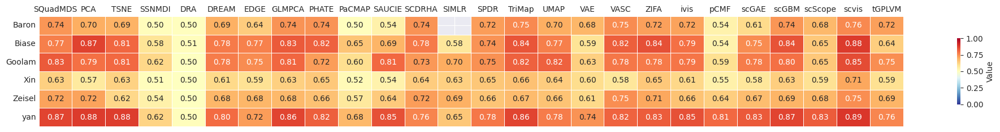

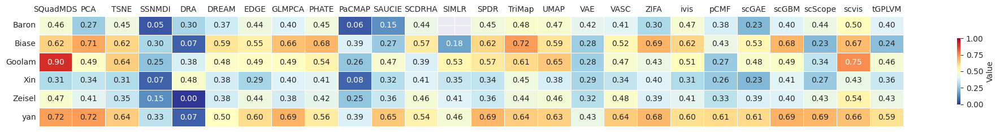

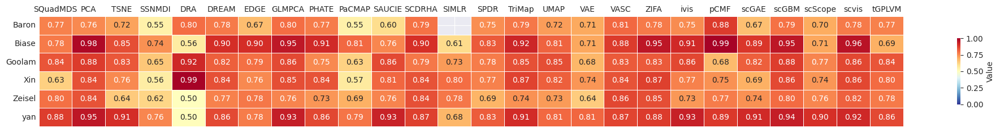

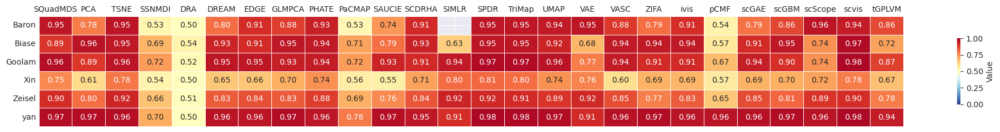

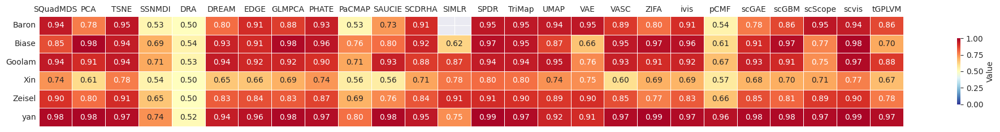

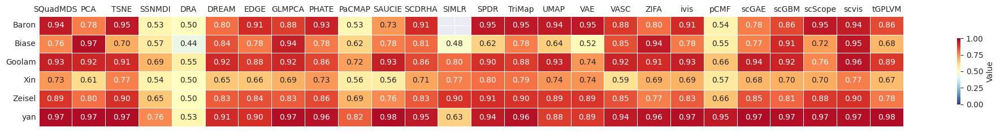

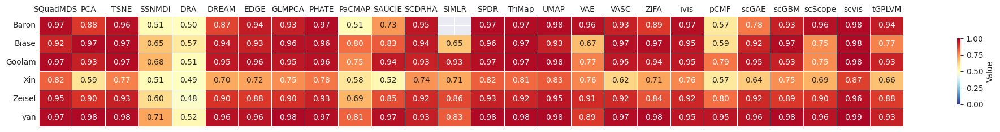

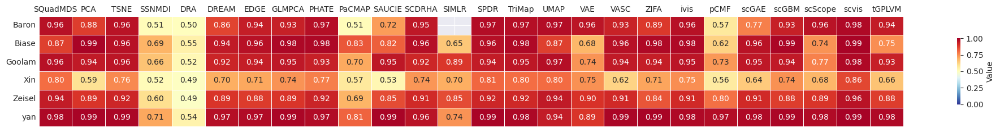

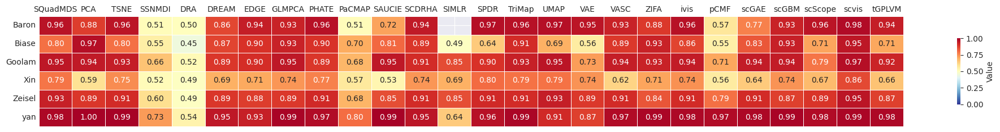

In [12]:
metrics = ['AUC','Qlocal','Qglobal','T_10','T_20','T_30','C_10','C_20','C_30']

for metric in metrics:
    '''
    file和df这两处需要修改
    '''
    file1 = f"/home/henu/work/result/metric/VASC/Baron/dr2.csv"
    file2 = f"/home/henu/work/result/metric/VASC/Biase/dr2.csv"
    file3 = f"/home/henu/work/result/metric/VASC/Goolam/dr2.csv"
    file4 = f"/home/henu/work/result/metric/VASC/Xin/dr2.csv"
    file5 = f"/home/henu/work/result/metric/VASC/yan/dr2.csv"
    file6 = f"/home/henu/work/result/metric/VASC/Zeisel/dr2.csv"

    # 读取文件
    df1 = pd.read_csv(file1)
    df1['Dataset'] = 'Baron'
    df2 = pd.read_csv(file2)
    df2['Dataset'] = 'Biase'
    df3 = pd.read_csv(file3)
    df3['Dataset'] = 'Goolam'
    df4 = pd.read_csv(file4)
    df4['Dataset'] = 'Xin'
    df5 = pd.read_csv(file5)
    df5['Dataset'] = 'yan'
    df6 = pd.read_csv(file6)
    df6['Dataset'] = 'Zeisel'


    # 排除特定的行
    excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
    df1 = df1[~df1['Method'].isin(excluded_methods)]
    df2 = df2[~df2['Method'].isin(excluded_methods)]
    df3 = df3[~df3['Method'].isin(excluded_methods)]
    df4 = df4[~df4['Method'].isin(excluded_methods)]
    df5 = df5[~df5['Method'].isin(excluded_methods)]
    df6 = df6[~df6['Method'].isin(excluded_methods)]

    # 重命名方法名
    df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df3.loc[df3['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df4.loc[df4['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df5.loc[df5['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df6.loc[df6['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

    # 拼接
    df_all = pd.concat([df1,df2,df3,df4,df5,df6])
    # print(df_all)

    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 2.45))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/VASC.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/VASC.pdf')
    # plt.show()

In [ ]:
metrics = ['Mrre_false_10','Mrre_false_20','Mrre_false_30','Mrre_missing_10','Mrre_missing_20','Mrre_missing_30','Pearson','nh_10','nh_20','nh_30']
for metric in metrics:
    '''
    file和df这两处需要修改
    '''
    file1 = f"/home/henu/work/result/metric/VASC/Baron/dr3.csv"
    file2 = f"/home/henu/work/result/metric/VASC/Biase/dr3.csv"
    file3 = f"/home/henu/work/result/metric/VASC/Goolam/dr3.csv"
    file4 = f"/home/henu/work/result/metric/VASC/Xin/dr3.csv"
    file5 = f"/home/henu/work/result/metric/VASC/yan/dr3.csv"
    file6 = f"/home/henu/work/result/metric/VASC/Zeisel/dr3.csv"

    # 读取文件
    df1 = pd.read_csv(file1)
    df1['Dataset'] = 'Baron'
    df2 = pd.read_csv(file2)
    df2['Dataset'] = 'Biase'
    df3 = pd.read_csv(file3)
    df3['Dataset'] = 'Goolam'
    df4 = pd.read_csv(file4)
    df4['Dataset'] = 'Xin'
    df5 = pd.read_csv(file5)
    df5['Dataset'] = 'yan'
    df6 = pd.read_csv(file6)
    df6['Dataset'] = 'Zeisel'


    # 排除特定的行
    excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
    df1 = df1[~df1['Method'].isin(excluded_methods)]
    df2 = df2[~df2['Method'].isin(excluded_methods)]
    df3 = df3[~df3['Method'].isin(excluded_methods)]
    df4 = df4[~df4['Method'].isin(excluded_methods)]
    df5 = df5[~df5['Method'].isin(excluded_methods)]
    df6 = df6[~df6['Method'].isin(excluded_methods)]

    # 重命名方法名
    df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df3.loc[df3['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df4.loc[df4['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df5.loc[df5['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
    df6.loc[df6['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

    # 拼接
    df_all = pd.concat([df1,df2,df3,df4,df5,df6])
    # print(df_all)

    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 2.45))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/VASC.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/VASC.pdf')
    # plt.show()

### TI

In [ ]:
metrics = ['knn_10','knn_20','knn_30','svm','nkr_10','nkr_20','nkr_30','aji_10','aji_20','aji_30','random_triplet','spearman','k-nearest','centroid_distance']

for metric in metrics:
    datasets = ['DA1_horns','DC3_VA1d_horns','horns','blastocyst','epiblast','ICM','trophectoderm','combination-1','combination-2','combination-3','epidermis','muscle','neuron','pair-1','pair-2','pair-3','pair-4','parenchyme','phagocyte','pharynx']
    df_all = pd.DataFrame()

    for dataset in datasets:
        file = f"/home/henu/work/result/metric/TI/{dataset}/dr1.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 7))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/TI.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/TI.pdf')
    # plt.show()


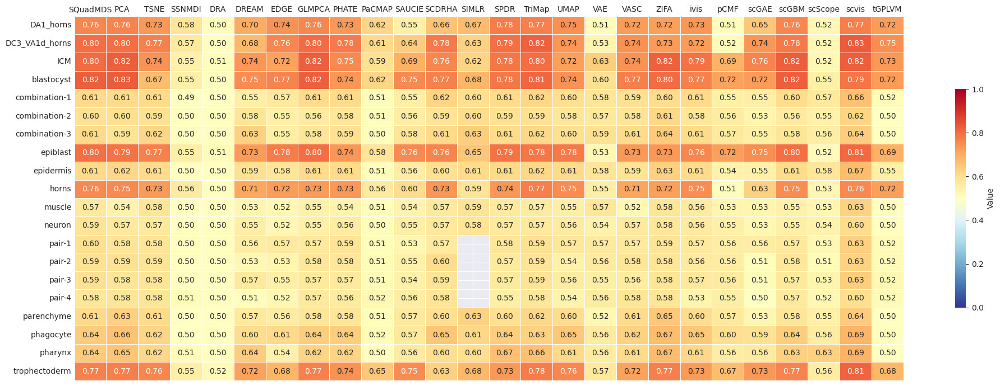

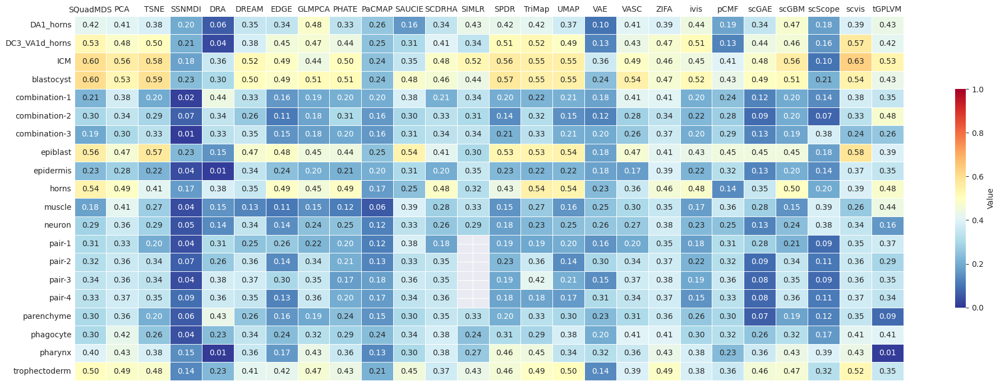

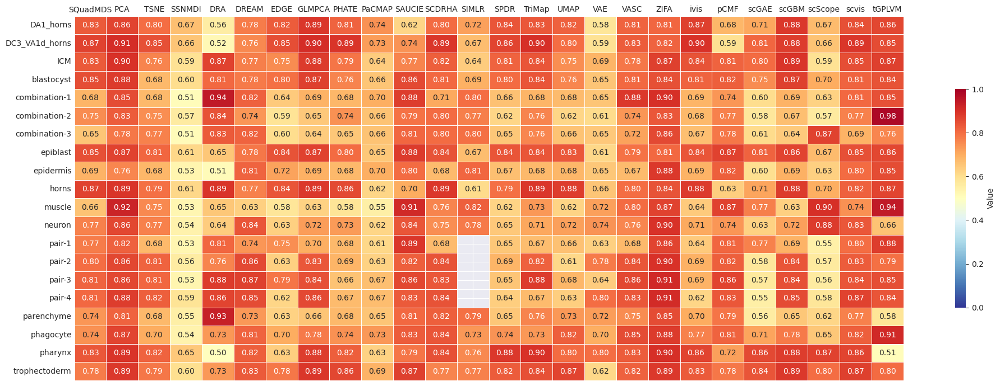

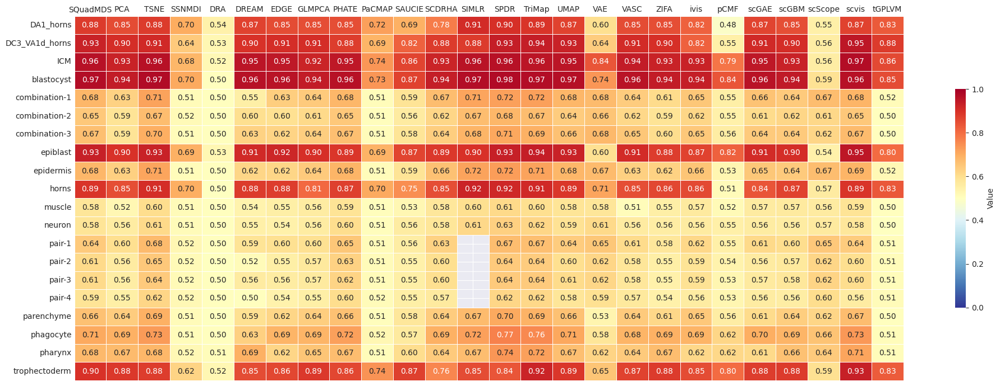

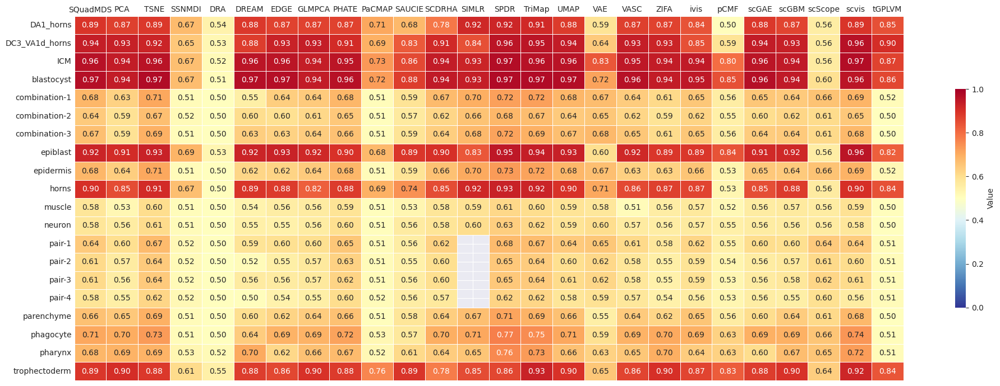

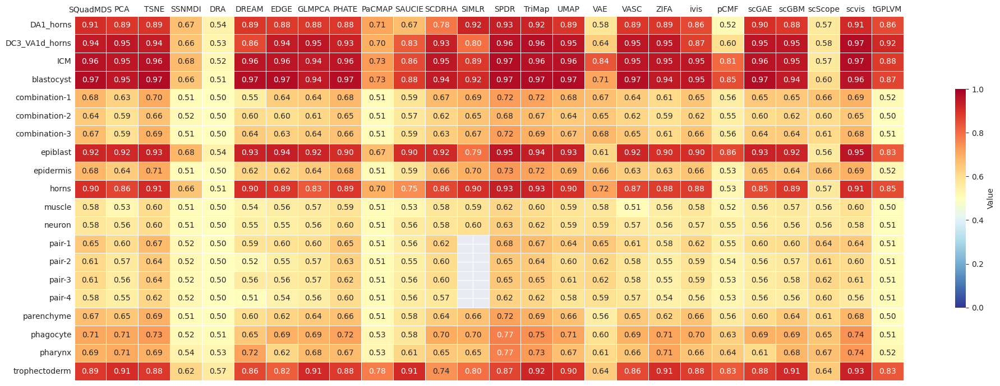

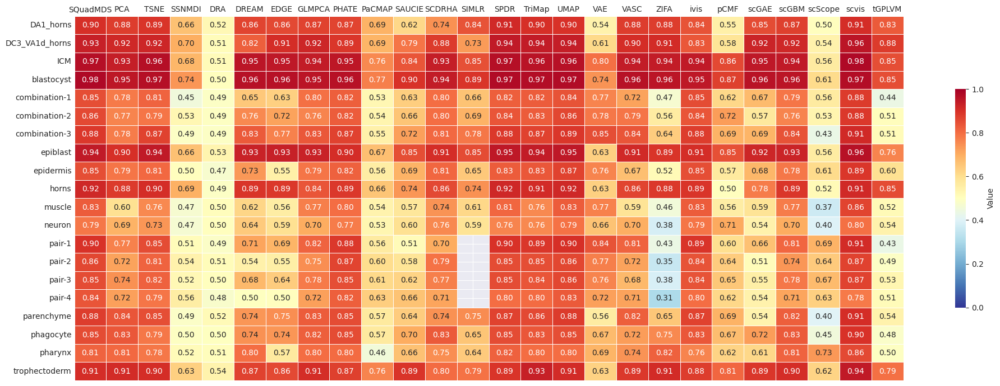

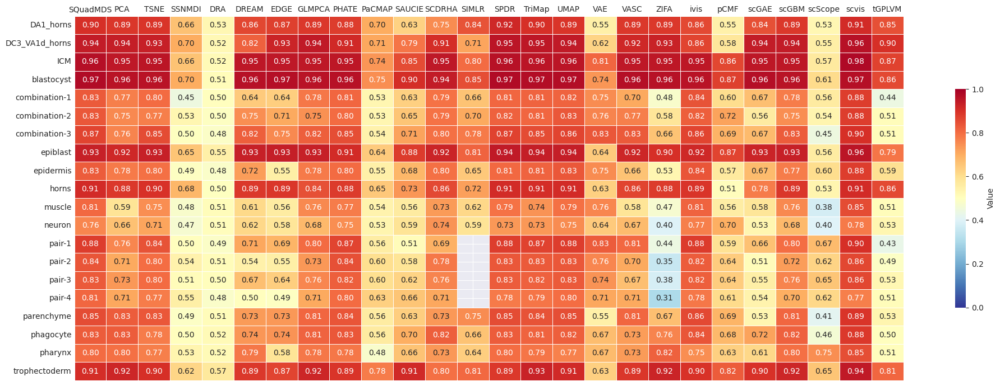

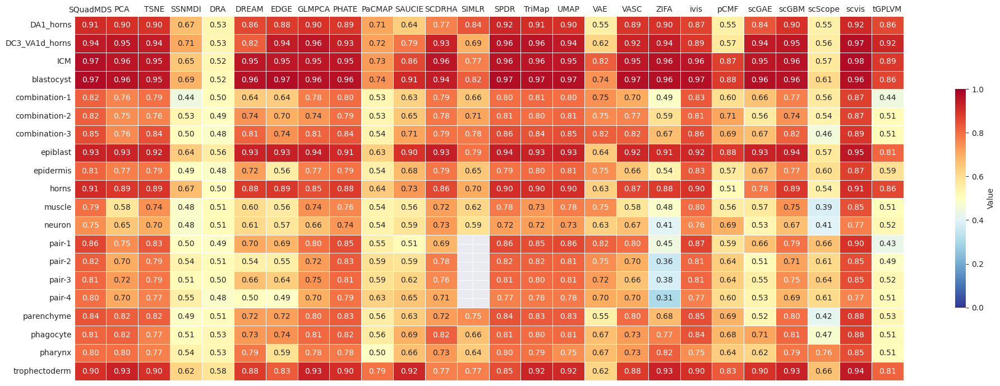

In [16]:
metrics = ['AUC','Qlocal','Qglobal','T_10','T_20','T_30','C_10','C_20','C_30']

for metric in metrics:
    datasets = ['DA1_horns','DC3_VA1d_horns','horns','blastocyst','epiblast','ICM','trophectoderm','combination-1','combination-2','combination-3','epidermis','muscle','neuron','pair-1','pair-2','pair-3','pair-4','parenchyme','phagocyte','pharynx']
    df_all = pd.DataFrame()

    for dataset in datasets:
        file = f"/home/henu/work/result/metric/TI/{dataset}/dr2.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 7))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/TI.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/TI.pdf')
    # plt.show()


In [ ]:
metrics = ['Mrre_false_10','Mrre_false_20','Mrre_false_30','Mrre_missing_10','Mrre_missing_20','Mrre_missing_30','Pearson','nh_10','nh_20','nh_30']

for metric in metrics:
    datasets = ['DA1_horns','DC3_VA1d_horns','horns','blastocyst','epiblast','ICM','trophectoderm','combination-1','combination-2','combination-3','epidermis','muscle','neuron','pair-1','pair-2','pair-3','pair-4','parenchyme','phagocyte','pharynx']
    df_all = pd.DataFrame()

    for dataset in datasets:
        file = f"/home/henu/work/result/metric/TI/{dataset}/dr3.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 7))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/TI.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/TI.pdf')
    # plt.show()


### simulate

In [ ]:
metrics = ['knn_10','knn_20','knn_30','svm','nkr_10','nkr_20','nkr_30','aji_10','aji_20','aji_30','random_triplet','spearman','k-nearest','centroid_distance']

for metric in metrics:
    datasets = ['default','dropout_-1','dropout_0', 'dropout_1', 'dropout_2', 'dropout_3']
    df_all = pd.DataFrame()

    for dataset in datasets:
        file = f"/home/henu/work/result/metric/simulate/{dataset}/dr1.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]
    heatmap_data = heatmap_data.loc[['default','dropout_-1','dropout_0', 'dropout_1', 'dropout_2', 'dropout_3']]
    heatmap_data = heatmap_data.T
    heatmap_data.columns = ['default','-1','0','1','2','3']

    # 画图
    '''
    按一个数据集高为0.35来调节
    (20,7)
    (6,8)
    (2.5,8)
    '''
    plt.figure(figsize=(4, 8))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        # cbar=False,
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)
    # 列标签放在图底部
    ax.xaxis.tick_bottom()

    # # 移除左侧数据集名称
    # ax.set_yticklabels([])

    # 旋转y轴标签，使其横向显示
    # plt.yticks(rotation=0)  # 0 度旋转，即横向显示
    plt.xticks(rotation=45)

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/dropout.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/dropout.pdf')
    # plt.show()

    # plt.savefig(f'/home/henu/work/analysis/test_figures/celltype.svg')

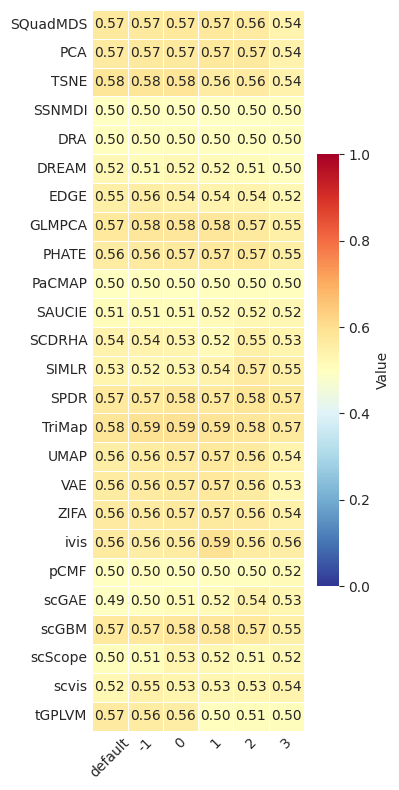

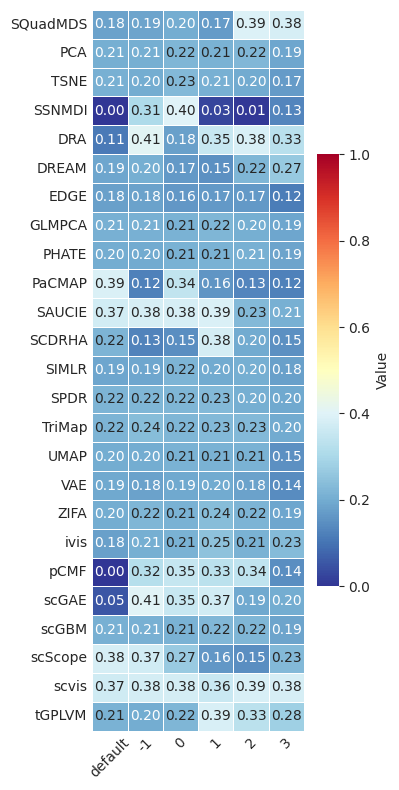

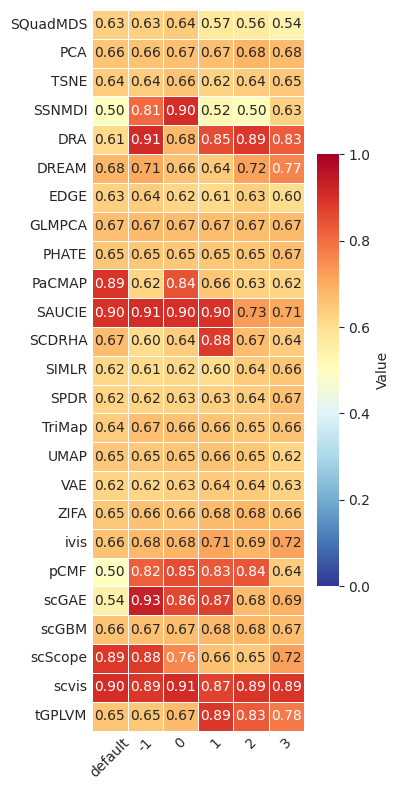

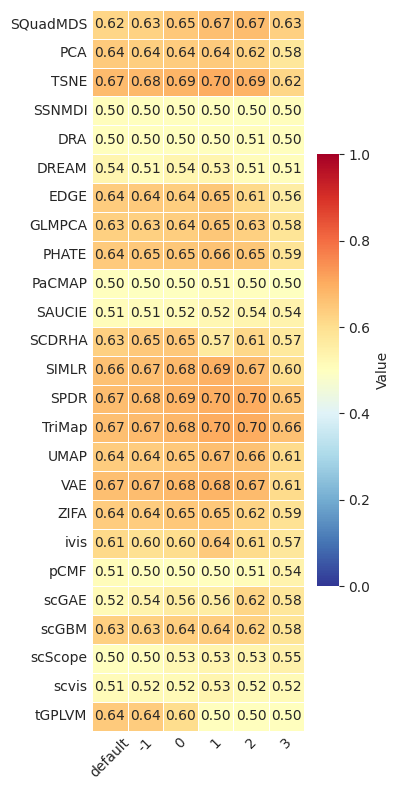

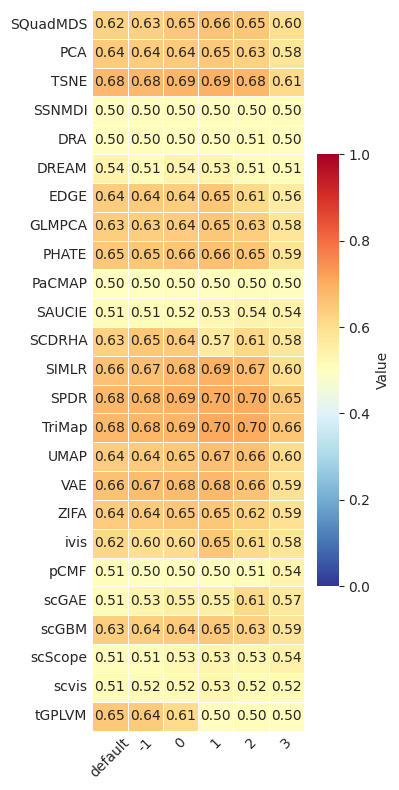

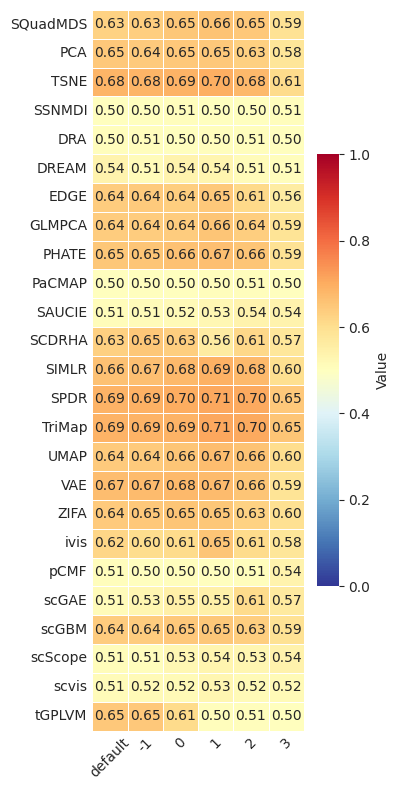

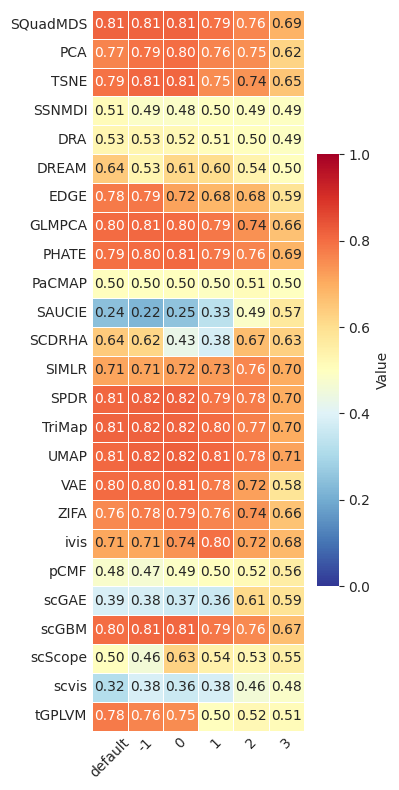

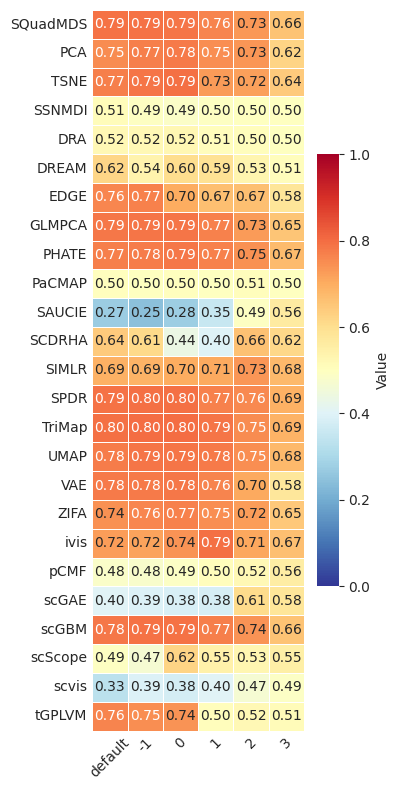

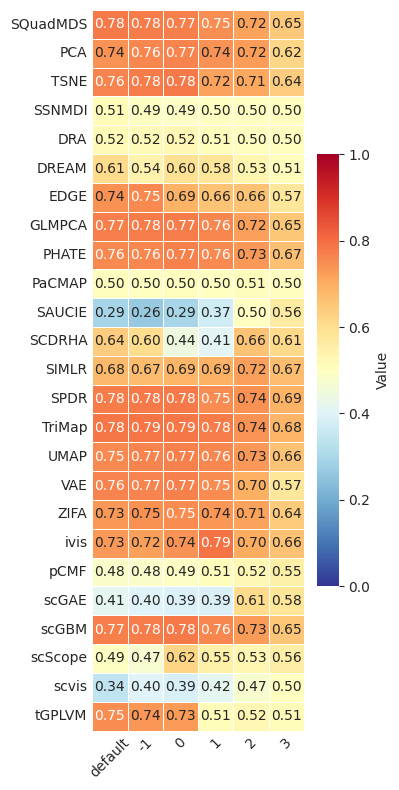

In [35]:
metrics = ['AUC','Qlocal','Qglobal','T_10','T_20','T_30','C_10','C_20','C_30']

for metric in metrics:
    datasets = ['default','dropout_-1','dropout_0', 'dropout_1', 'dropout_2', 'dropout_3']
    df_all = pd.DataFrame()

    for dataset in datasets:
        file = f"/home/henu/work/result/metric/simulate/{dataset}/dr2.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]
    heatmap_data = heatmap_data.loc[['default','dropout_-1','dropout_0', 'dropout_1', 'dropout_2', 'dropout_3']]
    heatmap_data = heatmap_data.T
    heatmap_data.columns = ['default','-1','0','1','2','3']

    # 画图
    '''
    按一个数据集高为0.35来调节
    (20,7)
    (4,8)
    '''
    plt.figure(figsize=(4, 8))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        # cbar=False,
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)
    # 列标签放在图底部
    ax.xaxis.tick_bottom()

    # # 移除左侧数据集名称
    # ax.set_yticklabels([])

    # 旋转y轴标签，使其横向显示
    # plt.yticks(rotation=0)  # 0 度旋转，即横向显示
    plt.xticks(rotation=45)

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/dropout.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/dropout.pdf')
    # plt.show()

    # plt.savefig(f'/home/henu/work/analysis/test_figures/celltype.svg')


In [ ]:
metrics = ['Mrre_false_10','Mrre_false_20','Mrre_false_30','Mrre_missing_10','Mrre_missing_20','Mrre_missing_30','Pearson','nh_10','nh_20','nh_30']

for metric in metrics:
    datasets = ['default','dropout_-1','dropout_0', 'dropout_1', 'dropout_2', 'dropout_3']
    df_all = pd.DataFrame()

    for dataset in datasets:
        file = f"/home/henu/work/result/metric/simulate/{dataset}/dr3.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]
    heatmap_data = heatmap_data.loc[['default','dropout_-1','dropout_0', 'dropout_1', 'dropout_2', 'dropout_3']]
    heatmap_data = heatmap_data.T
    heatmap_data.columns = ['default','-1','0','1','2','3']

    # 画图
    '''
    按一个数据集高为0.35来调节
    (20,7)
    (4.25,8)
    '''
    plt.figure(figsize=(4, 8))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        # cbar=False,
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)
    # 列标签放在图底部
    ax.xaxis.tick_bottom()

    # # 移除左侧数据集名称
    # ax.set_yticklabels([])

    # 旋转y轴标签，使其横向显示
    # plt.yticks(rotation=0)  # 0 度旋转，即横向显示
    plt.xticks(rotation=45)

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/dropout.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/dropout.pdf')
    # plt.show()

    # plt.savefig(f'/home/henu/work/analysis/test_figures/celltype.svg')


### 整合(VASC、SIMLR、benchmarker、DRA)

In [ ]:
metrics = ['knn_10','knn_20','knn_30','svm','nkr_10','nkr_20','nkr_30','aji_10','aji_20','aji_30','random_triplet','spearman','k-nearest','centroid_distance']

for metric in metrics:
    '''
    目前DRA指标还没有跑出来，暂不整合
    '''
    df_all = pd.DataFrame()
    fragments = ['VASC','SIMLR','benchmarker']
    for fragment in fragments:
        if fragment == 'VASC':
            datasets = ['Baron','Biase','Goolam','Xin','yan','Zeisel']
        elif fragment == 'SIMLR':
            datasets = ['Pollen','Usoskin']
        elif fragment == 'benchmarker':
            datasets = ['Baron_mouse','Darmanis','Pancreatic','Silver','Zhengmix4eq']
        else:
            datasets = []

        for dataset in datasets:
            file = f"/home/henu/work/result/metric/{fragment}/{dataset}/dr1.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 5))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/other.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/other.pdf')
    # plt.show()


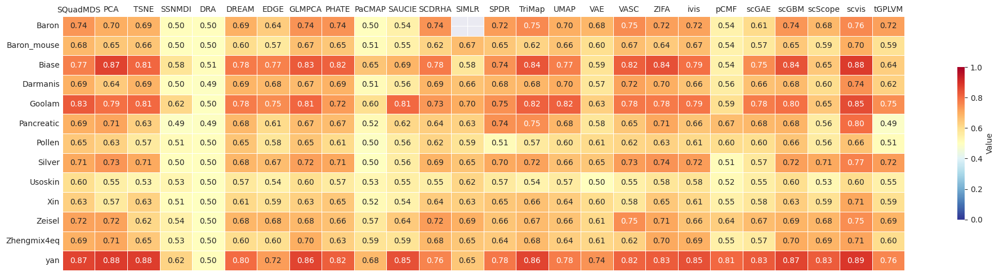

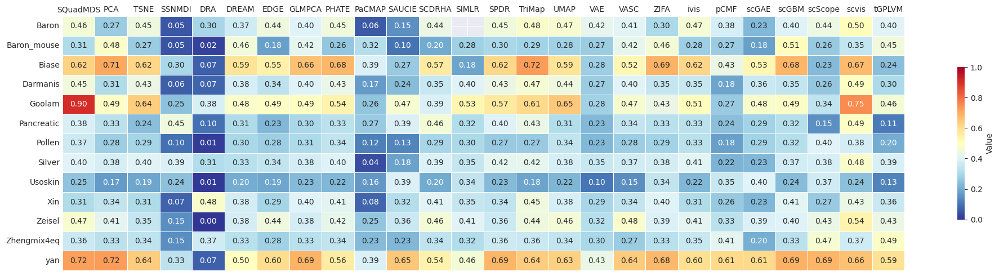

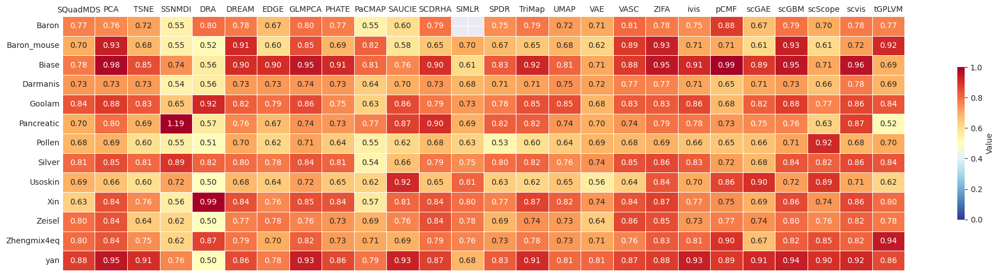

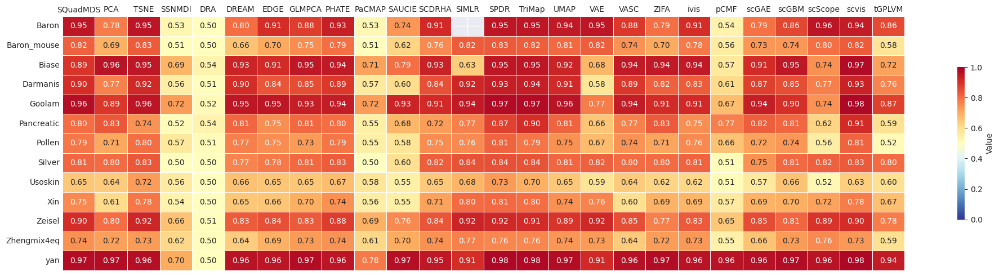

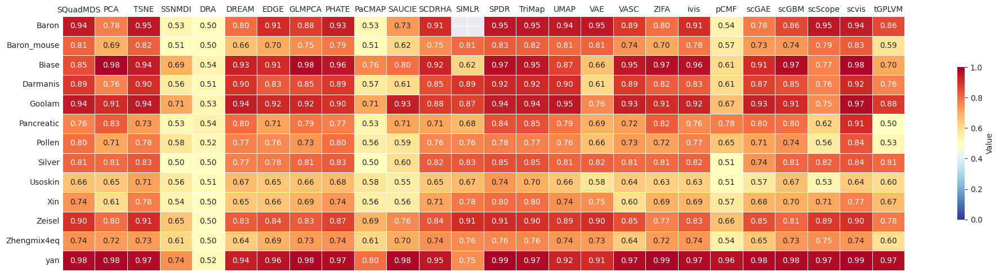

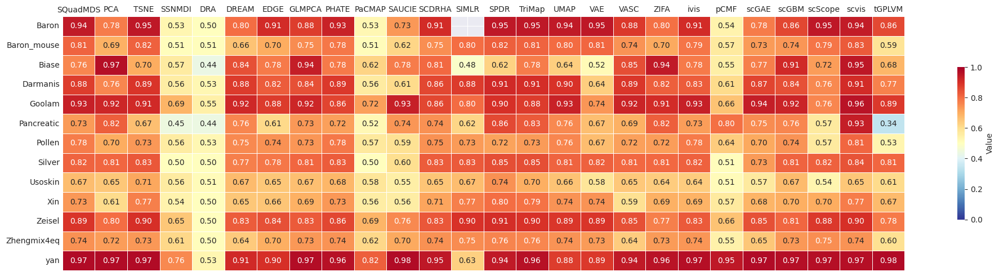

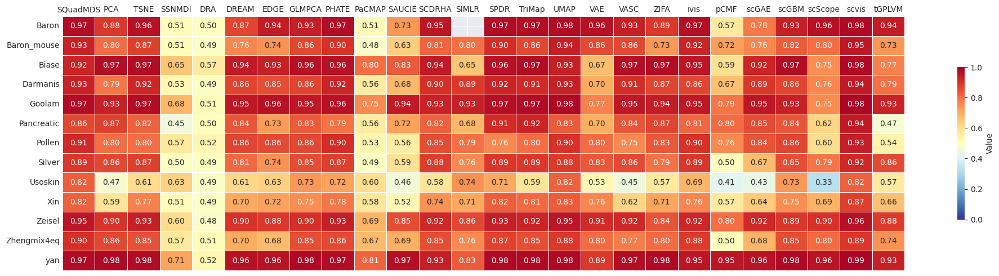

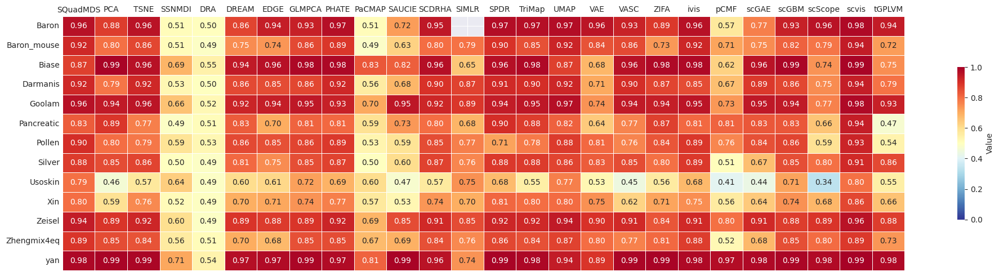

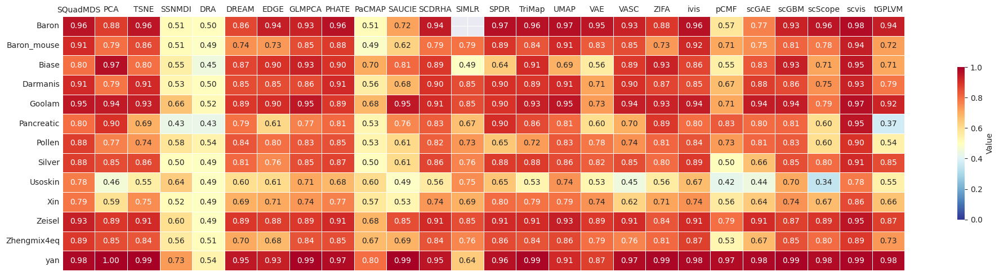

In [19]:
metrics = ['AUC','Qlocal','Qglobal','T_10','T_20','T_30','C_10','C_20','C_30']

for metric in metrics:
    '''
    目前DRA指标还没有跑出来，暂不整合
    '''
    df_all = pd.DataFrame()
    fragments = ['VASC','SIMLR','benchmarker']
    for fragment in fragments:
        if fragment == 'VASC':
            datasets = ['Baron','Biase','Goolam','Xin','yan','Zeisel']
        elif fragment == 'SIMLR':
            datasets = ['Pollen','Usoskin']
        elif fragment == 'benchmarker':
            datasets = ['Baron_mouse','Darmanis','Pancreatic','Silver','Zhengmix4eq']
        else:
            datasets = []

        for dataset in datasets:
            file = f"/home/henu/work/result/metric/{fragment}/{dataset}/dr2.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 5))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/other.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/other.pdf')
    # plt.show()


In [ ]:
metrics = ['Mrre_false_10','Mrre_false_20','Mrre_false_30','Mrre_missing_10','Mrre_missing_20','Mrre_missing_30','Pearson','nh_10','nh_20','nh_30']

for metric in metrics:
    '''
    目前DRA指标还没有跑出来，暂不整合
    '''
    df_all = pd.DataFrame()
    fragments = ['VASC','SIMLR','benchmarker']
    for fragment in fragments:
        if fragment == 'VASC':
            datasets = ['Baron','Biase','Goolam','Xin','yan','Zeisel']
        elif fragment == 'SIMLR':
            datasets = ['Pollen','Usoskin']
        elif fragment == 'benchmarker':
            datasets = ['Baron_mouse','Darmanis','Pancreatic','Silver','Zhengmix4eq']
        else:
            datasets = []

        for dataset in datasets:
            file = f"/home/henu/work/result/metric/{fragment}/{dataset}/dr3.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 5))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/DR/{metric}/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/other.svg')
    plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/other.pdf')
    # plt.show()


### 拼接50个真实数据集指标图

In [ ]:
metrics = ['T_10','T_20','T_30','C_10','C_20','C_30']
for metric in metrics:

    datasets1 = ['ATAC', 'BATCH', 'CITE', 'EMBYRO', 'IFNB', 'MARROW', 'MOBSC', 'OVARIAN', 'PANCREAS', 'SCGEMMETH',
            'SCGEMRNA', 'SCIATAC', 'SLIDE', 'ACINAR', 'VISIUM']
    df_all = pd.DataFrame()

    for dataset in datasets1:
        file = f"/home/henu/work/result/metric/scDesign3/{dataset}/dr2.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])


    datasets2 = ['DA1_horns','DC3_VA1d_horns','horns','blastocyst','epiblast','ICM','trophectoderm','combination-1','combination-2','combination-3','epidermis','muscle','neuron','pair-1','pair-2','pair-3','pair-4','parenchyme','phagocyte','pharynx']

    for dataset in datasets2:
        file = f"/home/henu/work/result/metric/TI/{dataset}/dr2.csv"
        df = pd.read_csv(file)
        df['Dataset'] = dataset

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df = df[~df['Method'].isin(excluded_methods)]

        # 重命名方法名
        df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df_all, df])

    fragments = ['VASC','SIMLR','benchmarker']
    for fragment in fragments:
        if fragment == 'VASC':
            datasets = ['Baron','Biase','Goolam','Xin','yan','Zeisel']
        elif fragment == 'SIMLR':
            datasets = ['Pollen','Usoskin']
        elif fragment == 'benchmarker':
            datasets = ['Baron_mouse','Darmanis','Pancreatic','Silver','Zhengmix4eq']
        else:
            datasets = []

        for dataset in datasets:
            file = f"/home/henu/work/result/metric/{fragment}/{dataset}/dr2.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])

    # print(df_all)
    # 透视表：行是数据集，列是方法，值是NMI
    heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

    # 将0.00和-0.00替换为0
    heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


    # 重新排序列，将SSNMDI与TSNE换一下位置
    order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
    heatmap_data = heatmap_data[order]

    # 重新排序索引，确保 datasets1 在前，datasets2 在中，剩余的在后
    all_datasets = datasets1 + datasets2 + heatmap_data.index.difference(datasets1 + datasets2).tolist()
    heatmap_data = heatmap_data.reindex(all_datasets)

    # 画图
    '''
    按一个数据集高为0.35来调节
    '''
    plt.figure(figsize=(20, 20))  # 调节宽和高
    ax = sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
        vmin=0.0,  # 颜色条取值范围
        vmax=1.0
    )

    # 移除x轴和y轴的标签
    ax.set_xlabel('')
    ax.set_ylabel('')
    # 将指标名称移到顶部
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    # 移除所有刻度线
    ax.tick_params(axis='both', which='both', length=0)

    # 旋转y轴标签，使其横向显示
    plt.yticks(rotation=0)  # 0 度旋转，即横向显示

    plt.tight_layout()

    # 保存为矢量图###
    result_path = f'/home/henu/work/result/figures/50RealDatasets/local/'
    if not os.path.exists(result_path):
        os.makedirs(result_path)
    plt.savefig(f'/home/henu/work/result/figures/50RealDatasets/local/{metric}.svg')
    # plt.savefig(f'/home/henu/work/result/figures/DR/{metric}/other.pdf')
    # plt.show()

### 50个真实数据集聚类指标图

In [ ]:
methods = ['kmeans','louvain','spectral']
metrics = ['NMI','ARI','COMP','HOMO','SIL']

for method in methods:
    for metric in metrics:
        df_all = pd.DataFrame()
        datasets3 = ['ACINAR','ATAC','BATCH','CITE','EMBYRO','MARROW','MOBSC','OVARIAN','PANCREAS','SCGEMMETH','SCGEMRNA','SCIATAC', 'VISIUM', 'IFNB','SLIDE']
        for dataset in datasets3:
            file = f"/home/henu/work/result/cluster/scDesign3/{dataset}/indicators/{method}_{metric}.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])

        datasets4 = ['DA1_horns','DC3_VA1d_horns','horns','blastocyst','epiblast','ICM','trophectoderm','combination-1','combination-2','combination-3','epidermis','muscle','neuron','pair-1','pair-2','pair-3','pair-4','parenchyme','phagocyte','pharynx']
        for dataset in datasets4:
            file = f"/home/henu/work/result/cluster/TI/{dataset}/indicators/{method}_{metric}.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])


        fragments = ['VASC','SIMLR','benchmarker']
        for fragment in fragments:
            if fragment == 'VASC':
                datasets = ['Baron','Biase','Goolam','Xin','yan','Zeisel']
            elif fragment == 'SIMLR':
                datasets = ['Pollen','Usoskin']
            elif fragment == 'benchmarker':
                datasets = ['Baron_mouse','Darmanis','Pancreatic','Silver','Zhengmix4eq']
            else:
                datasets = []

            for dataset in datasets:
                file = f"/home/henu/work/result/cluster/{fragment}/{dataset}/indicators/{method}_{metric}.csv"
                df = pd.read_csv(file)
                df['Dataset'] = dataset

                # 排除特定的行
                excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
                df = df[~df['Method'].isin(excluded_methods)]

                # 重命名方法名
                df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

                # 拼接
                df_all = pd.concat([df_all, df])

        # print(df_all)
        # 透视表：行是数据集，列是方法，值是NMI
        heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

        # 将0.00和-0.00替换为0
        heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


        # 重新排序列，将SSNMDI与TSNE换一下位置
        order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
        heatmap_data = heatmap_data[order]

          # 重新排序索引，确保 datasets1 在前，datasets2 在中，剩余的在后
        all_datasets = datasets3 + datasets4 + heatmap_data.index.difference(datasets3 + datasets4).tolist()
        heatmap_data = heatmap_data.reindex(all_datasets)

        # 画图
        '''
        按一个数据集高为0.35来调节
        '''
        plt.figure(figsize=(20, 20))  # 调节宽和高
        ax = sns.heatmap(
            heatmap_data,
            annot=True,
            fmt=".2f",
            cmap=cmap,
            linewidths=0.5,
            cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
            vmin=0.0,  # 颜色条取值范围
            vmax=1.0
        )

        # 移除x轴和y轴的标签
        ax.set_xlabel('')
        ax.set_ylabel('')
        # 将指标名称移到顶部
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')
        # 移除所有刻度线
        ax.tick_params(axis='both', which='both', length=0)

        # 旋转y轴标签，使其横向显示
        plt.yticks(rotation=0)  # 0 度旋转，即横向显示

        plt.tight_layout()

        # 保存为矢量图###
        result_path = f'/home/henu/work/result/figures/50RealDatasets/{method}'
        if not os.path.exists(result_path):
            os.makedirs(result_path)
        plt.savefig(f'/home/henu/work/result/figures/50RealDatasets/{method}/{metric}.svg')
        # plt.show()